In [1]:
import pandas as pd
import numpy as np

In [2]:
weather=pd.read_csv('https://raw.githubusercontent.com/dataquestio/project-walkthroughs/master/prophet_weather/weather.csv',index_col='DATE')

In [3]:
weather

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,14.76,NaN,NaN,0.09,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,12.97,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,11.18,NaN,NaN,0.43,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
null_pct=weather.apply(pd.isnull).sum()/weather.shape[0]

In [5]:
null_pct

STATION    0.000000
NAME       0.000000
ACMH       0.502175
ACSH       0.502149
AWND       0.264834
FMTM       0.475769
PGTM       0.349643
PRCP       0.000000
SNOW       0.000000
SNWD       0.000026
TAVG       0.679455
TMAX       0.000000
TMIN       0.000000
TSUN       0.997774
WDF1       0.599177
WDF2       0.497929
WDF5       0.500337
WDFG       0.659910
WDFM       0.903101
WESD       0.683882
WSF1       0.599073
WSF2       0.497929
WSF5       0.500362
WSFG       0.599151
WSFM       0.903101
WT01       0.656208
WT02       0.952211
WT03       0.931811
WT04       0.982267
WT05       0.981257
WT06       0.990525
WT07       0.994641
WT08       0.776043
WT09       0.994305
WT11       0.999146
WT13       0.893290
WT14       0.955576
WT15       0.997825
WT16       0.664104
WT17       0.996971
WT18       0.937610
WT19       0.999741
WT21       0.999819
WT22       0.997437
WV01       0.999974
WV20       0.999974
dtype: float64

In [6]:
valid_columns=weather.columns[null_pct<0.05]

In [7]:
valid_columns

Index(['STATION', 'NAME', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN'], dtype='object')

In [8]:
weather=weather[valid_columns].copy()

In [9]:
weather

,STATION,NAME,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


In [10]:
weather.columns=weather.columns.str.lower()

In [11]:
weather.columns

Index(['station', 'name', 'prcp', 'snow', 'snwd', 'tmax', 'tmin'], dtype='object')

In [12]:
weather.index

Index(['1970-01-01', '1970-01-02', '1970-01-03', '1970-01-04', '1970-01-05',
       '1970-01-06', '1970-01-07', '1970-01-08', '1970-01-09', '1970-01-10',
       ...
       '2022-11-08', '2022-11-09', '2022-11-10', '2022-11-11', '2022-11-12',
       '2022-11-13', '2022-11-14', '2022-11-15', '2022-11-16', '2022-11-17'],
      dtype='object', name='DATE', length=38628)

In [13]:
weather.index=pd.to_datetime(weather.index)

In [14]:
weather.index

DatetimeIndex(['1970-01-01', '1970-01-02', '1970-01-03', '1970-01-04',
               '1970-01-05', '1970-01-06', '1970-01-07', '1970-01-08',
               '1970-01-09', '1970-01-10',
               ...
               '2022-11-08', '2022-11-09', '2022-11-10', '2022-11-11',
               '2022-11-12', '2022-11-13', '2022-11-14', '2022-11-15',
               '2022-11-16', '2022-11-17'],
              dtype='datetime64[ns]', name='DATE', length=38628, freq=None)

In [15]:
weather.index.year.value_counts().sort_index()

1970    730
1971    730
1972    732
1973    730
1974    730
1975    730
1976    732
1977    730
1978    730
1979    730
1980    732
1981    730
1982    730
1983    730
1984    732
1985    730
1986    730
1987    730
1988    732
1989    730
1990    730
1991    730
1992    732
1993    730
1994    730
1995    730
1996    732
1997    730
1998    730
1999    730
2000    732
2001    730
2002    730
2003    730
2004    732
2005    730
2006    730
2007    730
2008    732
2009    730
2010    730
2011    730
2012    732
2013    730
2014    730
2015    730
2016    732
2017    730
2018    730
2019    730
2020    732
2021    730
2022    642
Name: DATE, dtype: int64

# Split the data

In [16]:
weather['station'].unique()

array(['USW00014732', 'USW00094789'], dtype=object)

In [17]:
weather['name'].unique()

array(['LAGUARDIA AIRPORT, NY US', 'JFK INTERNATIONAL AIRPORT, NY US'],
      dtype=object)

In [18]:
lga=weather[weather['station']=='USW00014732'].copy()

In [19]:
lga

,station,name,prcp,snow,snwd,tmax,tmin
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


In [20]:
weather=weather[weather['station']=='USW00094789']

In [21]:
weather.isnull().sum()

station    0
name       0
prcp       0
snow       0
snwd       1
tmax       0
tmin       0
dtype: int64

In [22]:
weather=weather.merge(lga,left_index=True,right_index=True)

In [23]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


Setting up an algorithm

In [24]:
weather['y']=weather['tmax_x']

In [25]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y
DATE,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,28
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,31
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,38
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,31
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,61
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,47
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,46


In [26]:
weather['y']=weather.shift(-1)['tmax_x']

In [27]:
weather[['tmax_x','y']]

,tmax_x,y
DATE,,
1970-01-01,28,31.0
1970-01-02,31,38.0
1970-01-03,38,31.0
1970-01-04,31,35.0
1970-01-05,35,36.0
...,...,...
2022-11-13,61,47.0
2022-11-14,47,46.0
2022-11-15,46,53.0


In [28]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y
DATE,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0


In [29]:
weather=weather.ffill()

In [30]:
weather.isnull().sum()

station_x    0
name_x       0
prcp_x       0
snow_x       0
snwd_x       0
tmax_x       0
tmin_x       0
station_y    0
name_y       0
prcp_y       0
snow_y       0
snwd_y       0
tmax_y       0
tmin_y       0
y            0
dtype: int64

In [31]:
weather['ds']=weather.index

In [32]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y,ds
DATE,,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0,1970-01-01
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0,1970-01-02
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0,1970-01-03
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0,1970-01-04
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0,1970-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0,2022-11-13
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0,2022-11-14
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0,2022-11-15


In [33]:
predictors=weather.columns[~weather.columns.isin(['y','name_x','station_x','name_y','station_y','ds'])]

In [34]:
predictors

Index(['prcp_x', 'snow_x', 'snwd_x', 'tmax_x', 'tmin_x', 'prcp_y', 'snow_y',
       'snwd_y', 'tmax_y', 'tmin_y'],
      dtype='object')

In [35]:
train=weather[:'2021-12-31']
test=weather['2021-12-21':]

In [36]:
train

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y,ds
DATE,,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0,1970-01-01
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0,1970-01-02
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0,1970-01-03
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0,1970-01-04
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0,1970-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.03,0.0,0.0,39,32,USW00014732,"LAGUARDIA AIRPORT, NY US",0.08,0.0,0.0,41,35,47.0,2021-12-27
2021-12-28,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.06,0.0,0.0,47,37,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.0,0.0,48,37,45.0,2021-12-28
2021-12-29,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.35,0.0,0.0,45,41,USW00014732,"LAGUARDIA AIRPORT, NY US",0.16,0.0,0.0,44,42,50.0,2021-12-29


In [37]:
pip install prophet

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [38]:
from prophet import Prophet

In [39]:
from prophet import Prophet

In [40]:
def fit_prophet(train):
    m=Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m
m=fit_prophet(train)

12:30:41 - cmdstanpy - INFO - Chain [1] start processing
12:31:02 - cmdstanpy - INFO - Chain [1] done processing


In [41]:
predictions=m.predict(test)

In [42]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-21,61.484539,35.385768,50.351003,61.484539,61.484539,-18.372292,-18.372292,-18.372292,-11.047792,...,-0.092646,-0.092646,-0.092646,-7.231853,-7.231853,-7.231853,0.0,0.0,0.0,43.112248
1,2021-12-22,61.484331,37.094327,52.746820,61.484331,61.484331,-16.592740,-16.592740,-16.592740,-9.032154,...,-0.262054,-0.262054,-0.262054,-7.298533,-7.298533,-7.298533,0.0,0.0,0.0,44.891590
2,2021-12-23,61.484122,33.478037,48.934243,61.484122,61.484122,-20.577579,-20.577579,-20.577579,-13.141890,...,-0.073153,-0.073153,-0.073153,-7.362536,-7.362536,-7.362536,0.0,0.0,0.0,40.906543
3,2021-12-24,61.483913,32.365966,48.397015,61.483913,61.483913,-20.912557,-20.912557,-20.912557,-13.512995,...,0.024358,0.024358,0.024358,-7.423920,-7.423920,-7.423920,0.0,0.0,0.0,40.571356
4,2021-12-25,61.483704,38.497493,54.506275,61.483704,61.483704,-15.138062,-15.138062,-15.138062,-7.638692,...,-0.016623,-0.016623,-0.016623,-7.482747,-7.482747,-7.482747,0.0,0.0,0.0,46.345642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,2022-11-13,61.416259,48.743469,64.053014,61.398371,61.427387,-5.037506,-5.037506,-5.037506,-2.145680,...,0.092128,0.092128,0.092128,-2.983954,-2.983954,-2.983954,0.0,0.0,0.0,56.378753
328,2022-11-14,61.416050,42.772263,57.664054,61.398016,61.427268,-11.146177,-11.146177,-11.146177,-8.352480,...,0.327990,0.327990,0.327990,-3.121687,-3.121687,-3.121687,0.0,0.0,0.0,50.269873
329,2022-11-15,61.415841,41.743364,57.211189,61.397675,61.427229,-12.087152,-12.087152,-12.087152,-8.735732,...,-0.092646,-0.092646,-0.092646,-3.258773,-3.258773,-3.258773,0.0,0.0,0.0,49.328689
330,2022-11-16,61.415632,43.201001,58.508172,61.397363,61.427191,-10.695985,-10.695985,-10.695985,-7.038800,...,-0.262054,-0.262054,-0.262054,-3.395131,-3.395131,-3.395131,0.0,0.0,0.0,50.719647


<AxesSubplot: xlabel='ds'>

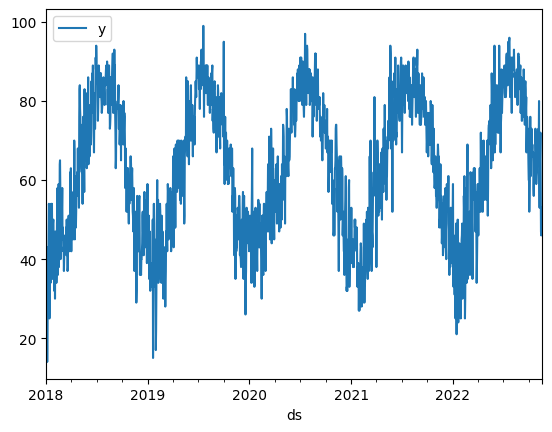

In [43]:
weather['2018-01-01':].plot('ds','y')

In [44]:
from prophet.plot import plot_plotly,plot_components_plotly,plot_cross_validation_metric

plot_components_plotly(m,predictions)

In [45]:
import plotly.graph_objs as go_

In [46]:
pip install plotly

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [47]:
from prophet.utilities import regressor_coefficients
regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.118130,-0.196900,-0.196900,-0.196900
1,snow_x,additive,0.064540,-0.012219,-0.012219,-0.012219
2,snwd_x,additive,0.209635,0.064363,0.064363,0.064363
3,tmax_x,additive,61.758648,0.013739,0.013739,0.013739
4,tmin_x,additive,47.494024,-0.081952,-0.081952,-0.081952
5,prcp_y,additive,0.123378,-0.323481,-0.323481,-0.323481
6,snow_y,additive,0.071347,-0.490822,-0.490822,-0.490822
7,snwd_y,additive,0.217759,-0.201785,-0.201785,-0.201785
8,tmax_y,additive,62.609277,0.280319,0.280319,0.280319
9,tmin_y,additive,48.923130,0.425442,0.425442,0.425442


In [48]:
predictions.index=test.index
predictions['actual']=test['y']

In [49]:
def mse(predictions,actual_label='actual',pred_label='yhat'):
    se=((predictions[actual_label]-predictions[pred_label])**2)
    print(se.mean())
mse(predictions)

40.52843810090968


In [50]:
from prophet.diagnostics import cross_validation

m=fit_prophet(weather)
cv=cross_validation(m,initial=f'{365*5} days',period='180 days',horizon='180 days',parallel='processes')

12:49:24 - cmdstanpy - INFO - Chain [1] start processing
12:49:46 - cmdstanpy - INFO - Chain [1] done processing
12:49:53 - cmdstanpy - INFO - Chain [1] start processing
12:49:53 - cmdstanpy - INFO - Chain [1] start processing
12:49:53 - cmdstanpy - INFO - Chain [1] start processing
12:49:53 - cmdstanpy - INFO - Chain [1] start processing
12:49:54 - cmdstanpy - INFO - Chain [1] done processing
12:49:55 - cmdstanpy - INFO - Chain [1] done processing
12:49:56 - cmdstanpy - INFO - Chain [1] done processing
12:49:57 - cmdstanpy - INFO - Chain [1] done processing
12:49:58 - cmdstanpy - INFO - Chain [1] start processing
12:49:58 - cmdstanpy - INFO - Chain [1] start processing
12:49:59 - cmdstanpy - INFO - Chain [1] start processing
12:50:02 - cmdstanpy - INFO - Chain [1] start processing
12:50:02 - cmdstanpy - INFO - Chain [1] done processing
12:50:04 - cmdstanpy - INFO - Chain [1] done processing
12:50:04 - cmdstanpy - INFO - Chain [1] done processing
12:50:07 - cmdstanpy - INFO - Chain [1]

12:58:39 - cmdstanpy - INFO - Chain [1] start processing
12:58:47 - cmdstanpy - INFO - Chain [1] done processing
12:58:55 - cmdstanpy - INFO - Chain [1] done processing
12:58:56 - cmdstanpy - INFO - Chain [1] start processing
12:59:04 - cmdstanpy - INFO - Chain [1] start processing
12:59:16 - cmdstanpy - INFO - Chain [1] done processing
12:59:25 - cmdstanpy - INFO - Chain [1] start processing
12:59:31 - cmdstanpy - INFO - Chain [1] done processing
12:59:37 - cmdstanpy - INFO - Chain [1] done processing
12:59:39 - cmdstanpy - INFO - Chain [1] start processing
12:59:45 - cmdstanpy - INFO - Chain [1] start processing
13:00:08 - cmdstanpy - INFO - Chain [1] done processing
13:00:16 - cmdstanpy - INFO - Chain [1] start processing
13:00:29 - cmdstanpy - INFO - Chain [1] done processing
13:00:37 - cmdstanpy - INFO - Chain [1] start processing
13:00:42 - cmdstanpy - INFO - Chain [1] done processing
13:00:51 - cmdstanpy - INFO - Chain [1] start processing
13:00:57 - cmdstanpy - INFO - Chain [1]

In [52]:
mse(cv,'y')

36.18129739793801


<AxesSubplot: >

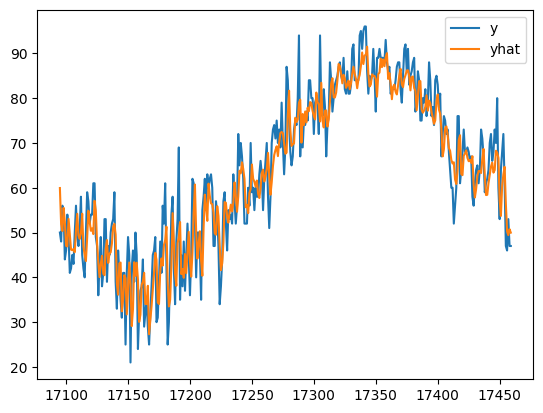

In [53]:
cv[['y','yhat']][-365:].plot()

In [54]:
m=fit_prophet(weather)
m.predict(weather.iloc[-1:])

13:23:13 - cmdstanpy - INFO - Chain [1] start processing
13:23:31 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.688427,42.880569,57.950926,61.688427,61.688427,-11.530708,-11.530708,-11.530708,-7.905865,...,-0.065181,-0.065181,-0.065181,-3.559663,-3.559663,-3.559663,0.0,0.0,0.0,50.157719


In [55]:
m=Prophet()
m.fit(weather)
future=m.make_future_dataframe(periods=365)

13:26:40 - cmdstanpy - INFO - Chain [1] start processing
13:26:51 - cmdstanpy - INFO - Chain [1] done processing


In [56]:
future

,ds
0,1970-01-01
1,1970-01-02
2,1970-01-03
3,1970-01-04
4,1970-01-05
...,...
19674,2023-11-13
19675,2023-11-14
19676,2023-11-15
19677,2023-11-16


In [57]:
forecast=m.predict(future)

In [58]:
plot_plotly(m,forecast)